In [1]:
import torch
import torchaudio as ta
import torchaudio.functional as taf
import torchaudio.transforms as tat

print(torch.__version__)
print(ta.__version__)

import matplotlib
import matplotlib.pyplot as plt
from IPython.display import Audio, display

import pandas as pd
import os
import pprint

from typing import *
import itertools
from collections import Counter

import numpy as np

1.8.1
0.8.0a0+e4e171a


In [103]:
fname = "data/birdclef-2021/train_short_audio/yebela1/XC389231.ogg"

In [104]:
info = ta.info(fname)

In [105]:
info.sample_rate

32000

In [106]:
info.num_channels

1

In [107]:
info.encoding

'VORBIS'

In [108]:
sr = 32000
n_fft=512
window_length=512
n_mels=64
hop_length=312
f_min=150
f_max=15000

In [109]:
melspec = tat.MelSpectrogram(
            sample_rate=sr,
            n_fft=n_fft,
            win_length=window_length,
            hop_length=hop_length,
            f_min=f_min,
            f_max=f_max,
            pad=0,
            n_mels=n_mels,
            power=2.0,
            normalized=True, )

In [110]:
p2db = tat.AmplitudeToDB(stype='power', top_db=80)

In [111]:
t, sr = ta.load(fname)

In [112]:
def print_metadata(metadata, src=None):
  if src:
    print("-" * 10)
    print("Source:", src)
    print("-" * 10)
  print(" - sample_rate:", metadata.sample_rate)
  print(" - num_channels:", metadata.num_channels)
  print(" - num_frames:", metadata.num_frames)
  print(" - bits_per_sample:", metadata.bits_per_sample)
  print(" - encoding:", metadata.encoding)
  print()

In [113]:
def plot_specgram(waveform, sample_rate, title="Spectrogram", xlim=None):
  waveform = waveform.numpy()

  num_channels, num_frames = waveform.shape
  time_axis = torch.arange(0, num_frames) / sample_rate

  figure, axes = plt.subplots(num_channels, 1)
  if num_channels == 1:
    axes = [axes]
  for c in range(num_channels):
    axes[c].specgram(waveform[c], Fs=sample_rate, cmap='viridis')
    if num_channels > 1:
      axes[c].set_ylabel(f'Channel {c+1}')
    if xlim:
      axes[c].set_xlim(xlim)
  figure.suptitle(title)
  plt.show(block=False)

In [114]:
def plot_mel_fbank(fbank, title=None):
  fig, axs = plt.subplots(1, 1)
  axs.set_title(title or 'Filter bank')
  axs.imshow(fbank, aspect='auto')
  axs.set_ylabel('frequency bin')
  axs.set_xlabel('mel bin')
  plt.show(block=False)


In [115]:
def play_audio(waveform, sample_rate):
  waveform = waveform.numpy()

  num_channels, num_frames = waveform.shape
  if num_channels == 1:
    display(Audio(waveform[0], rate=sample_rate))
  elif num_channels == 2:
    display(Audio((waveform[0], waveform[1]), rate=sample_rate))
  else:
    raise ValueError("Waveform with more than 2 channels are not supported.")

In [116]:
def plot_waveform(waveform, sample_rate, title="Waveform", xlim=None, ylim=None):
  waveform = waveform.numpy()

  num_channels, num_frames = waveform.shape
  time_axis = torch.arange(0, num_frames) / sample_rate

  figure, axes = plt.subplots(num_channels, 1)
  if num_channels == 1:
    axes = [axes]
  for c in range(num_channels):
    axes[c].plot(time_axis, waveform[c], linewidth=1)
    axes[c].grid(True)
    if num_channels > 1:
      axes[c].set_ylabel(f'Channel {c+1}')
    if xlim:
      axes[c].set_xlim(xlim)
    if ylim:
      axes[c].set_ylim(ylim)
  figure.suptitle(title)
  plt.show(block=False)

In [117]:
def plot_spectrogram(spec, title=None, ylabel='freq_bin', aspect='auto', xmax=None):
  fig, axs = plt.subplots(1, 1)
  axs.set_title(title or 'Spectrogram (db)')
  axs.set_ylabel(ylabel)
  axs.set_xlabel('frame')
  # im = axs.imshow(librosa.power_to_db(spec), origin='lower', aspect=aspect)
  im = axs.imshow(spec.squeeze(), origin='lower', aspect=aspect)
  if xmax:
    axs.set_xlim((0, xmax))
  fig.colorbar(im, ax=axs)
  plt.show(block=False)

In [118]:
def plot_pitch(waveform, sample_rate, pitch):
  figure, axis = plt.subplots(1, 1)
  axis.set_title("Pitch Feature")
  axis.grid(True)

  end_time = waveform.shape[1] / sample_rate
  time_axis = torch.linspace(0, end_time,  waveform.shape[1])
  axis.plot(time_axis, waveform[0], linewidth=1, color='gray', alpha=0.3)

  axis2 = axis.twinx()
  time_axis = torch.linspace(0, end_time, pitch.shape[1])
  ln2 = axis2.plot(
      time_axis, pitch[0], linewidth=2, label='Pitch', color='green')

  axis2.legend(loc=0)
  plt.show(block=False)

In [119]:
df_train_meta = pd.read_csv("data/birdclef-2021/train_metadata.csv")
df_train_meta

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,date,filename,license,rating,time,url
0,acafly,['amegfi'],"['begging call', 'call', 'juvenile']",35.3860,-84.1250,Empidonax virescens,Acadian Flycatcher,Mike Nelson,2012-08-12,XC109605.ogg,Creative Commons Attribution-NonCommercial-Sha...,2.5,09:30,https://www.xeno-canto.org/109605
1,acafly,[],['call'],9.1334,-79.6501,Empidonax virescens,Acadian Flycatcher,Allen T. Chartier,2000-12-26,XC11209.ogg,Creative Commons Attribution-NonCommercial-Sha...,3.0,?,https://www.xeno-canto.org/11209
2,acafly,[],['call'],5.7813,-75.7452,Empidonax virescens,Acadian Flycatcher,Sergio Chaparro-Herrera,2012-01-10,XC127032.ogg,Creative Commons Attribution-NonCommercial-Sha...,3.0,15:20,https://www.xeno-canto.org/127032
3,acafly,['whwbec1'],['call'],4.6717,-75.6283,Empidonax virescens,Acadian Flycatcher,Oscar Humberto Marin-Gomez,2009-06-19,XC129974.ogg,Creative Commons Attribution-NonCommercial-Sha...,3.5,07:50,https://www.xeno-canto.org/129974
4,acafly,['whwbec1'],['call'],4.6717,-75.6283,Empidonax virescens,Acadian Flycatcher,Oscar Humberto Marin-Gomez,2009-06-19,XC129981.ogg,Creative Commons Attribution-NonCommercial-Sha...,3.5,07:50,https://www.xeno-canto.org/129981
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62869,yetvir,[],"['adult', 'male', 'song']",30.2150,-97.6505,Vireo flavifrons,Yellow-throated Vireo,Caleb Helsel,2020-07-10,XC591680.ogg,Creative Commons Attribution-NonCommercial-Sha...,1.0,08:30,https://www.xeno-canto.org/591680
62870,yetvir,[],"['life stage uncertain', 'sex uncertain', 'song']",42.3005,-72.5877,Vireo flavifrons,Yellow-throated Vireo,Christopher McPherson,2019-05-31,XC600085.ogg,Creative Commons Attribution-NonCommercial-Sha...,5.0,09:30,https://www.xeno-canto.org/600085
62871,yetvir,"['amered', 'eawpew', 'norcar', 'reevir1']","['adult', 'male', 'song']",42.3005,-72.5877,Vireo flavifrons,Yellow-throated Vireo,Christopher McPherson,2020-06-02,XC602701.ogg,Creative Commons Attribution-NonCommercial-Sha...,4.5,08:30,https://www.xeno-canto.org/602701
62872,yetvir,[],['uncertain'],32.2357,-99.8811,Vireo flavifrons,Yellow-throated Vireo,Brad Banner,2019-04-27,XC614733.ogg,Creative Commons Attribution-NonCommercial-Sha...,4.0,17:30,https://www.xeno-canto.org/614733


In [124]:
def show_waveform(fname, show_pitch=False):
    
    pp = pprint.PrettyPrinter(indent=2)
    
    info = ta.info(fname)
    print_metadata(info, fname)
    
    bn = os.path.basename(fname).replace('wav', 'ogg')
    entry = df_train_meta[df_train_meta.filename == bn].to_dict(orient='records')
    pp.pprint(entry)
    
    wf, sr = ta.load(fname)
    play_audio(wf, sr)
    # plot_specgram(wf, sr)
    plot_spectrogram(p2db(melspec(wf)))
    if show_pitch:
        pitch = taf.detect_pitch_frequency(wf, sr)
        plot_pitch(wf, sr, pitch)
    

----------
Source: data/birdclef-2021/train_short_audio/yebela1/XC389231.ogg
----------
 - sample_rate: 32000
 - num_channels: 1
 - num_frames: 257080
 - bits_per_sample: 0
 - encoding: VORBIS

[ { 'author': 'Lari Boesing',
    'common_name': 'Yellow-bellied Elaenia',
    'date': '2014-09-17',
    'filename': 'XC389231.ogg',
    'latitude': -23.2261,
    'license': 'Creative Commons Attribution-NonCommercial-ShareAlike 4.0',
    'longitude': -46.347,
    'primary_label': 'yebela1',
    'rating': 4.0,
    'scientific_name': 'Elaenia flavogaster',
    'secondary_labels': '[]',
    'time': '09:30',
    'type': "['song']",
    'url': 'https://www.xeno-canto.org/389231'}]


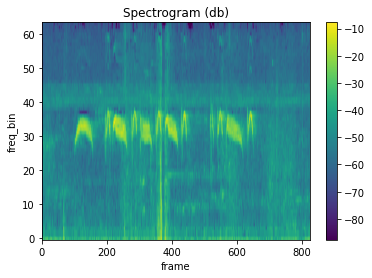

In [125]:
show_waveform(fname)

----------
Source: data/birdclef-2021/train_short_audio/yebela1/XC389231.ogg
----------
 - sample_rate: 32000
 - num_channels: 1
 - num_frames: 257080
 - bits_per_sample: 0
 - encoding: VORBIS

[ { 'author': 'Lari Boesing',
    'common_name': 'Yellow-bellied Elaenia',
    'date': '2014-09-17',
    'filename': 'XC389231.ogg',
    'latitude': -23.2261,
    'license': 'Creative Commons Attribution-NonCommercial-ShareAlike 4.0',
    'longitude': -46.347,
    'primary_label': 'yebela1',
    'rating': 4.0,
    'scientific_name': 'Elaenia flavogaster',
    'secondary_labels': '[]',
    'time': '09:30',
    'type': "['song']",
    'url': 'https://www.xeno-canto.org/389231'}]


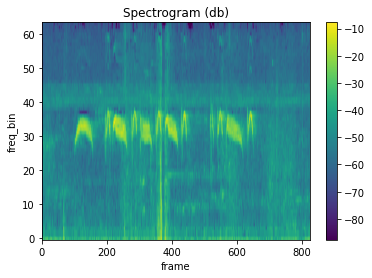

In [126]:
show_waveform(fname)

In [128]:
# show_waveform("data/birdclef-2021/train_soundscapes/2782_SSW_20170701.ogg")

In [129]:
# show_waveform("data/birdclef-2021/train_soundscapes.wav/2782_SSW_20170701.ogg.wav")

----------
Source: data/birdclef-2021/train_short_audio/brncre/XC373918.ogg
----------
 - sample_rate: 32000
 - num_channels: 1
 - num_frames: 1469162
 - bits_per_sample: 0
 - encoding: VORBIS

[ { 'author': 'Scott Olmstead',
    'common_name': 'Brown Creeper',
    'date': '2017-05-28',
    'filename': 'XC373918.ogg',
    'latitude': 31.859,
    'license': 'Creative Commons Attribution-NonCommercial-ShareAlike 4.0',
    'longitude': -109.334,
    'primary_label': 'brncre',
    'rating': 4.0,
    'scientific_name': 'Certhia americana',
    'secondary_labels': '[]',
    'time': '17:21',
    'type': "['call']",
    'url': 'https://www.xeno-canto.org/373918'}]


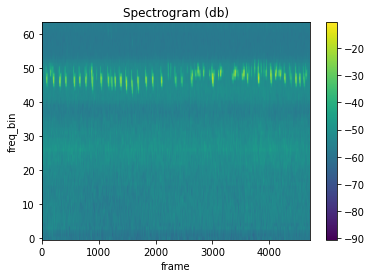

In [130]:
show_waveform("data/birdclef-2021/train_short_audio/brncre/XC373918.ogg")

----------
Source: data/birdclef-2021/train_short_audio.wav/amecro/XC112829.wav
----------
 - sample_rate: 32000
 - num_channels: 1
 - num_frames: 4327168
 - bits_per_sample: 16
 - encoding: PCM_S

[ { 'author': 'Jonathon Jongsma',
    'common_name': 'American Crow',
    'date': '2012-11-16',
    'filename': 'XC112829.ogg',
    'latitude': 44.942,
    'license': 'Creative Commons Attribution-ShareAlike 3.0',
    'longitude': -93.259,
    'primary_label': 'amecro',
    'rating': 4.5,
    'scientific_name': 'Corvus brachyrhynchos',
    'secondary_labels': "['haiwoo']",
    'time': '08:54',
    'type': "['call']",
    'url': 'https://www.xeno-canto.org/112829'}]


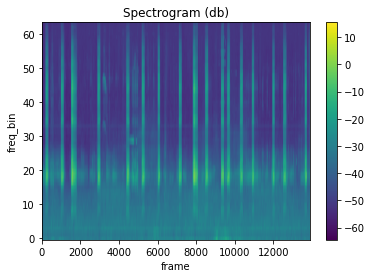

In [131]:
show_waveform("data/birdclef-2021/train_short_audio.wav/amecro/XC112829.wav")

## train soundscapes

In [237]:
df_ss = pd.read_csv("data/birdclef-2021/train_soundscape_labels.csv")
df_ss

,row_id,site,audio_id,seconds,birds
0,7019_COR_5,COR,7019,5,nocall
1,7019_COR_10,COR,7019,10,nocall
2,7019_COR_15,COR,7019,15,nocall
3,7019_COR_20,COR,7019,20,nocall
4,7019_COR_25,COR,7019,25,nocall
...,...,...,...,...,...
2395,54955_SSW_580,SSW,54955,580,nocall
2396,54955_SSW_585,SSW,54955,585,grycat
2397,54955_SSW_590,SSW,54955,590,grycat
2398,54955_SSW_595,SSW,54955,595,nocall


In [222]:
ss_birds = dict(Counter(itertools.chain(*df_ss['birds'].str.split(' '))))
ss_birds

{'nocall': 1529,
 'rubwre1': 18,
 'obnthr1': 18,
 'brnjay': 7,
 'sthwoo1': 1,
 'rucwar': 179,
 'grekis': 12,
 'runwre1': 19,
 'rtlhum': 1,
 'hofwoo1': 13,
 'clcrob': 4,
 'yehcar1': 2,
 'melbla1': 2,
 'crfpar': 18,
 'whcpar': 6,
 'bobfly1': 90,
 'grhcha1': 2,
 'plawre1': 12,
 'orcpar': 4,
 'orfpar': 1,
 'bucmot2': 4,
 'bkcchi': 67,
 'grycat': 67,
 'reevir1': 154,
 'eawpew': 78,
 'chswar': 16,
 'blujay': 12,
 'swaspa': 9,
 'dowwoo': 3,
 'rewbla': 78,
 'belkin1': 3,
 'haiwoo': 5,
 'comgra': 3,
 'norwat': 1,
 'amegfi': 6,
 'comyel': 29,
 'sonspa': 90,
 'eastow': 21,
 'norcar': 20,
 'gockin': 19,
 'cangoo': 18,
 'amecro': 1,
 'amerob': 7,
 'yebsap': 8,
 'norfli': 6,
 'woothr': 2,
 'balori': 40,
 'rebwoo': 5,
 'ovenbi1': 2}

<AxesSubplot:>

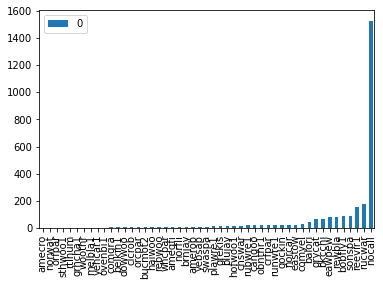

In [232]:
pd.DataFrame.from_dict(ss_birds, orient='index').sort_values(by=0).plot.bar()

<AxesSubplot:>

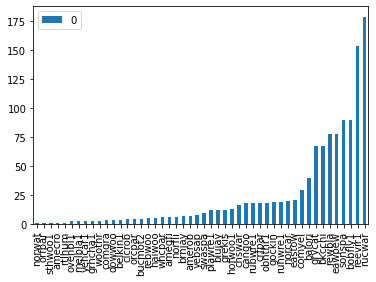

In [233]:
ssx_birds = ss_birds.copy()
del ssx_birds['nocall']
pd.DataFrame.from_dict(ssx_birds, orient='index').sort_values(by=0).plot.bar()

In [236]:
df_ss_birds = pd.DataFrame.from_dict(ss_birds, orient='index').sort_values(by=0).reset_index(drop=False)
df_ss_birds.columns = ['bird', 'count']
df_ss_birds

,bird,count
0,amecro,1
1,norwat,1
2,orfpar,1
3,sthwoo1,1
4,rtlhum,1
5,grhcha1,2
6,woothr,2
7,melbla1,2
8,yehcar1,2
9,ovenbi1,2


In [239]:
df_ss_ssw = df_ss[df_ss.site == 'SSW']
df_ss_ssw

,row_id,site,audio_id,seconds,birds
1200,2782_SSW_5,SSW,2782,5,bkcchi grycat reevir1
1201,2782_SSW_10,SSW,2782,10,eawpew grycat reevir1
1202,2782_SSW_15,SSW,2782,15,bkcchi eawpew grycat reevir1
1203,2782_SSW_20,SSW,2782,20,eawpew grycat reevir1
1204,2782_SSW_25,SSW,2782,25,eawpew grycat reevir1
...,...,...,...,...,...
2395,54955_SSW_580,SSW,54955,580,nocall
2396,54955_SSW_585,SSW,54955,585,grycat
2397,54955_SSW_590,SSW,54955,590,grycat
2398,54955_SSW_595,SSW,54955,595,nocall


In [240]:
ssw_birds = dict(Counter(itertools.chain(*df_ss_ssw['birds'].str.split(' '))))
ssw_birds

{'bkcchi': 67,
 'grycat': 67,
 'reevir1': 154,
 'eawpew': 78,
 'chswar': 16,
 'nocall': 690,
 'blujay': 12,
 'swaspa': 9,
 'dowwoo': 3,
 'rewbla': 78,
 'belkin1': 3,
 'haiwoo': 5,
 'comgra': 3,
 'norwat': 1,
 'amegfi': 6,
 'comyel': 29,
 'sonspa': 90,
 'eastow': 21,
 'norcar': 20,
 'gockin': 19,
 'cangoo': 18,
 'amecro': 1,
 'amerob': 7,
 'yebsap': 8,
 'norfli': 6,
 'woothr': 2,
 'balori': 40,
 'rebwoo': 5,
 'ovenbi1': 2}

## Implementation 0
- validation set based on soundscapes from Ithaca SSW
- training set only for birds in above sounscapes
- equal distribution of birds samples in training set

In [2]:
from torch.utils.data import Dataset, DataLoader
from dataclasses import dataclass
import glob
import random
from torch import nn
import torch.nn.functional as F
from catalyst import dl, utils
from catalyst.data.transforms import ToTensor

In [132]:
@dataclass
class Config:
    data_dir = 'data/birdclef-2021'
    duration: float = 5  
    sr = 32000
    n_frames = duration * sr
    n_fft = 512
    window_length = 512
    n_mels = 64
    hop_length = 312
    f_min = 150
    f_max = 15000
    
class ValidDataset(Dataset):
    def __init__(self, 
                 cfg: Config,
                 site: str,
                 ):
        self.cfg = cfg
        self.site = site
        self.sss = glob.glob(f"{cfg.data_dir}/train_soundscapes.wav/*_{site}_*.wav")
        self.df_ss = pd.read_csv(f"{cfg.data_dir}/train_soundscape_labels.csv")
        self.df_ss = self.df_ss[self.df_ss['site'] == site].reset_index(drop=True)
        self.labels = [x for x in sorted(set(itertools.chain(*self.df_ss['birds'].str.split(' ')))) if x != 'nocall']
        self.indices = {b:self.labels.index(b) for b in self.labels}
        
    def __len__(self):
        return len(self.df_ss)
    
    def __getitem__(self, idx):
        row = self.df_ss.iloc[idx]
        fname = glob.glob(f"{self.cfg.data_dir}/train_soundscapes.wav/{row.audio_id}_{row.site}_*.wav")[0]
        sig, _ = ta.load(filepath=fname, frame_offset=cfg.sr * (row.seconds - cfg.duration), num_frames=cfg.n_frames)
        
        label = torch.zeros(len(self.labels))
        if row.birds != 'nocall':
            birds = row.birds.split(' ')
            indices = [self.indices[b] for b in birds]
            label[indices] = 1.0

        return sig, label
        

In [133]:
cfg = Config()

In [134]:
vs = ValidDataset(cfg, 'SSW')

In [135]:
vs.df_ss.iloc[25]

row_id        2782_SSW_130
site                   SSW
audio_id              2782
seconds                130
birds       grycat reevir1
Name: 25, dtype: object

In [136]:
# %%time
# for v in vs: pass # +- 6 min

In [137]:
vdl = DataLoader(vs, batch_size=32, shuffle=True, num_workers=12)
# vdl = DataLoader(vs, batch_size=8, shuffle=True)

In [138]:
# %%time 
# for x, y in vdl:
#     pass

In [139]:
class TrainDataset(Dataset):
    def __init__(self,
                 cfg: Config,
                 labels: List[str],
                 size: int
                ):
        self.cfg = cfg
        self.labels = labels
        self.indices = {b:self.labels.index(b) for b in self.labels}
        self.size = size
        
    def __len__(self):
        return self.size
        
    def __getitem__(self, idx):
        b = random.choice(self.labels)
        f = random.choice(glob.glob(f"{self.cfg.data_dir}/train_short_audio.wav/{b}/*.wav"))
        n_frames = ta.info(f).num_frames
        offset = random.randint(0, n_frames - cfg.n_frames)
        sig, _ = ta.load(filepath=f, frame_offset=offset, num_frames=cfg.n_frames)
        
        label = torch.zeros(len(self.labels))
        label[self.indices[b]] = 1.0
        return sig, label
    

In [140]:
ts = TrainDataset(cfg, vs.labels, 32*12*10)

In [141]:
tdl = DataLoader(ts, batch_size=32, shuffle=True, num_workers=12)
# tdl = DataLoader(ts, batch_size=8, shuffle=True)

In [142]:
# %%time 
# for i, (x, y) in enumerate(tdl):
#     pass

In [143]:
# for x, y in tdl:
#     print(x.shape)
#     break

In [144]:
class PANNsLoss(nn.Module):
    def __init__(self):
        super().__init__()

    @staticmethod
    def stabilize_input(cwo):
        cwo = torch.where(torch.isnan(cwo),
                          torch.zeros_like(cwo),
                          cwo)
        cwo = torch.where(torch.isinf(cwo),
                          torch.zeros_like(cwo),
                          cwo)
        cwo = cwo.clamp(0, 1)
        return cwo

    def forward(self, input, target):
        cwo = self.stabilize_input(input)
        return F.binary_cross_entropy(cwo, target)


In [145]:
class Sig2Spec(torch.nn.Module):
    def __init__(self, cfg: Config):
        super().__init__()
        self.melspec = tat.MelSpectrogram(
            sample_rate=cfg.sr,
            n_fft=cfg.n_fft,
            win_length=cfg.window_length,
            hop_length=cfg.hop_length,
            f_min=cfg.f_min,
            f_max=cfg.f_max,
            pad=0,
            n_mels=cfg.n_mels,
            power=2.0,
            normalized=True, )
        self.p2db = tat.AmplitudeToDB(stype='power', top_db=80)

    @staticmethod
    def normalize(spec: torch.Tensor) -> torch.Tensor:
        spec -= spec.min()
        if spec.max() != 0:
            spec /= spec.max()
        else:
            spec = torch.clamp(spec, 0, 1)
        return spec

    def forward(self, sig: torch.Tensor, *args, **kwargs) -> torch.Tensor:
        spec = self.melspec(sig)
        spec = self.p2db(spec)
        spec = self.normalize(spec)
        return spec


In [146]:
itr = iter(tdl)

In [147]:
s2s = Sig2Spec(cfg)
sig = next(itr)
s2s(sig[0]).shape

torch.Size([32, 1, 64, 513])

In [148]:
def init_layer(layer):
    """Initialize a Linear or Convolutional layer. """
    nn.init.xavier_uniform_(layer.weight)

    if hasattr(layer, 'bias'):
        if layer.bias is not None:
            layer.bias.data.fill_(0.)

def init_bn(bn):
    """Initialize a Batchnorm layer. """
    bn.bias.data.fill_(0.)
    bn.weight.data.fill_(1.)


class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):

        super(ConvBlock, self).__init__()

        self.conv1 = nn.Conv2d(in_channels=in_channels,
                               out_channels=out_channels,
                               kernel_size=(3, 3), stride=(1, 1),
                               padding=(1, 1), bias=False)

        self.conv2 = nn.Conv2d(in_channels=out_channels,
                               out_channels=out_channels,
                               kernel_size=(3, 3), stride=(1, 1),
                               padding=(1, 1), bias=False)

        self.bn1 = nn.BatchNorm2d(out_channels)
        self.bn2 = nn.BatchNorm2d(out_channels)

        self.init_weight()

    def init_weight(self):
        init_layer(self.conv1)
        init_layer(self.conv2)
        init_bn(self.bn1)
        init_bn(self.bn2)

    def forward(self, input, pool_size=(2, 2), pool_type='avg'):

        x = input
        x = F.relu_(self.bn1(self.conv1(x)))
        x = F.relu_(self.bn2(self.conv2(x)))
        if pool_type == 'max':
            x = F.max_pool2d(x, kernel_size=pool_size)
        elif pool_type == 'avg':
            x = F.avg_pool2d(x, kernel_size=pool_size)
        elif pool_type == 'avg+max':
            x1 = F.avg_pool2d(x, kernel_size=pool_size)
            x2 = F.max_pool2d(x, kernel_size=pool_size)
            x = x1 + x2
        else:
            raise Exception('Incorrect argument!')

        return x


class AttBlock(nn.Module):
    def __init__(self, n_in, n_out, activation='linear', temperature=1.):
        super(AttBlock, self).__init__()

        self.activation = activation
        self.temperature = temperature
        self.att = nn.Conv1d(in_channels=n_in, out_channels=n_out, kernel_size=1, stride=1, padding=0, bias=True)
        self.cla = nn.Conv1d(in_channels=n_in, out_channels=n_out, kernel_size=1, stride=1, padding=0, bias=True)

        self.bn_att = nn.BatchNorm1d(n_out)
        self.init_weights()

    def init_weights(self):
        init_layer(self.att)
        init_layer(self.cla)
        init_bn(self.bn_att)

    def nonlinear_transform(self, x):
        if self.activation == 'linear':
            return x
        elif self.activation == 'sigmoid':
            return torch.sigmoid(x)

    def forward(self, x):
        # x: (n_samples, n_in, n_time)
        norm_att = torch.softmax(torch.clamp(self.att(x), -10, 10), dim=-1)
        cla = self.nonlinear_transform(self.cla(x))
        x = torch.sum(norm_att * cla, dim=2)
        return x, norm_att, cla



class Cnn14_DecisionLevelAtt(nn.Module):
    def __init__(self, classes_num: int = 527):
        super(Cnn14_DecisionLevelAtt, self).__init__()
        self.interpolate_ratio = 32  # Downsampled ratio
        self.bn0 = nn.BatchNorm2d(64)
        self.conv_block1 = ConvBlock(in_channels=1, out_channels=64)
        self.conv_block2 = ConvBlock(in_channels=64, out_channels=128)
        self.conv_block3 = ConvBlock(in_channels=128, out_channels=256)
        self.conv_block4 = ConvBlock(in_channels=256, out_channels=512)
        self.conv_block5 = ConvBlock(in_channels=512, out_channels=1024)
        self.conv_block6 = ConvBlock(in_channels=1024, out_channels=2048)

        [p.detach() for p in list(self.conv_block1.parameters(recurse=True))]

        self.fc1 = nn.Linear(2048, 2048, bias=True)
        self.att_block = AttBlock(2048, classes_num, activation='sigmoid')

        self.init_weight()
        
    def init_weight(self):
        init_bn(self.bn0)
        init_layer(self.fc1)

    def forward(self, input):
        # input.shape = bs, 1, h, w
        x = input.permute(0, 2, 3, 1)

        x = self.bn0(x)
        x = x.transpose(1, 3)  # [bs, 1, w, h]
        x = self.conv_block1(x, pool_size=(2, 2), pool_type='avg')
        x = F.dropout(x, p=0.2, training=self.training)
        x = self.conv_block2(x, pool_size=(2, 2), pool_type='avg')
        x = F.dropout(x, p=0.2, training=self.training)
        x = self.conv_block3(x, pool_size=(2, 2), pool_type='avg')
        x = F.dropout(x, p=0.2, training=self.training)
        x = self.conv_block4(x, pool_size=(2, 2), pool_type='avg')
        x = F.dropout(x, p=0.2, training=self.training)
        x = self.conv_block5(x, pool_size=(2, 2), pool_type='avg')
        x = F.dropout(x, p=0.2, training=self.training)
        x = self.conv_block6(x, pool_size=(1, 1), pool_type='avg')
        x = F.dropout(x, p=0.2, training=self.training)
        x = torch.mean(x, dim=3)

        x1 = F.max_pool1d(x, kernel_size=3, stride=1, padding=1)
        x2 = F.avg_pool1d(x, kernel_size=3, stride=1, padding=1)
        x = x1 + x2
        x = F.dropout(x, p=0.5, training=self.training)
        x = x.transpose(1, 2)
        x = F.relu_(self.fc1(x))
        x = x.transpose(1, 2)
        x = F.dropout(x, p=0.5, training=self.training)

        (clipwise_output, _, segmentwise_output) = self.att_block(x)
        return clipwise_output


In [149]:
model = Cnn14_DecisionLevelAtt()
weights = torch.load("data/Cnn14_DecisionLevelAtt_mAP=0.425.pth")
blocks_to_remove = [
    'spectrogram_extractor.stft.conv_real.weight',
    'spectrogram_extractor.stft.conv_imag.weight',
    'logmel_extractor.melW',
]
for b in blocks_to_remove: weights['model'].pop(b)
model.load_state_dict(weights['model'])

n_classes = len(ts.labels)
att_block = AttBlock(2048, n_classes, activation='sigmoid')
att_block.init_weights()
model.att_block = att_block

sig2spec = Sig2Spec(cfg)
model = nn.Sequential(sig2spec, model)

# model = model.cuda()

In [150]:
# model(next(itr)[0].cuda()).shape

In [151]:
import neptune
neptune.init(project_qualified_name='botkop/lark')

Project(botkop/lark)

In [152]:
model

Sequential(
  (0): Sig2Spec(
    (melspec): MelSpectrogram(
      (spectrogram): Spectrogram()
      (mel_scale): MelScale()
    )
    (p2db): AmplitudeToDB()
  )
  (1): Cnn14_DecisionLevelAtt(
    (bn0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv_block1): ConvBlock(
      (conv1): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (conv_block2): ConvBlock(
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=T

In [153]:
lr = 1e-4
n_epochs = 10
n_samples = len(tdl)

loss_fn = PANNsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=lr*10, steps_per_epoch=n_samples, epochs=n_epochs)

In [154]:
model = model.cuda()
loss_fn = loss_fn.cuda()

In [155]:
def f1(y_true, y_pred, thresh: float) -> dict:
    tp = (y_pred[torch.where(y_true == 1)] >= thresh).sum()
    tn = (y_pred[torch.where(y_true == 0)] < thresh).sum()
    fp = (y_pred[torch.where(y_true == 0)] >= thresh).sum()
    fn = (y_pred[torch.where(y_true == 1)] < thresh).sum()
    if tp + fp + fn == 0:
        f = 1.0
    else:
        f = tp / (tp + (fp + fn) / 2)
    # d = {"tp": tp.item(), "tn": tn.item(), "fp": fp.item(), "fn": fn.item(), "f1": f.item()}
    # return d
    return f.item()


In [156]:
# from tqdm import tqdm
import sys
from tqdm.notebook import tqdm

def tv_loop(dl, mode):
    if mode == 'train':
        model.train()
    else:
        model.eval()
        
    def inner_loop():
        nonlocal tot_loss
        nonlocal tot_score
        for x, y in pbar:
            x = x.cuda()
            y = y.cuda()
            pred = model(x)
            loss = loss_fn(pred, y)
            score = f1(y, pred, 0.5)
            pbar.set_description(f"{mode} loss: {loss:>8f} f1: {score:>8f}")
            tot_loss += loss.item()
            tot_score += score
            if mode == 'train':
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                scheduler.step()
        
    tot_loss = 0
    tot_score = 0
       
    with tqdm(dl, leave=False) as pbar:
        if mode == 'valid':
            with torch.no_grad():
                inner_loop()
        else:
            inner_loop()
            
    n_batches = len(dl)
    tot_loss /= n_batches
    tot_score /= n_batches
    return tot_loss, tot_score

In [157]:
with tqdm(range(n_epochs)) as pbar:
    for epoch in pbar:
        train_loss, train_score = tv_loop(tdl, 'train')
        valid_loss, valid_score = tv_loop(vdl, 'valid')
        msg = f"epoch: {epoch + 1:3d} train loss: {train_loss:>8f} train f1: {train_score:>8f} valid loss: {valid_loss:>8f} valid f1: {valid_score:>8f}"
        print(msg)    

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/120 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

epoch:   1 train loss: 0.581880 train f1: 0.039464 valid loss: 0.204631 valid f1: 0.000000


  0%|          | 0/120 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

epoch:   2 train loss: 0.176175 train f1: 0.005424 valid loss: 0.132196 valid f1: 0.004049


  0%|          | 0/120 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

epoch:   3 train loss: 0.134711 train f1: 0.114062 valid loss: 0.122055 valid f1: 0.013305


  0%|          | 0/120 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
loaders = {
    "train": tdl,
    "valid": vdl
}

runner = dl.SupervisedRunner(
    input_key="features", output_key="logits", target_key="targets", loss_key="loss"
)

In [ ]:
torch.cuda.empty_cache()

In [48]:
runner.train(
    model=model,
    criterion=loss_fn,
    optimizer=optimizer,
    scheduler=scheduler,
    loaders=loaders,
    logdir="./logdir",
    num_epochs=3,
    valid_loader="valid",
    valid_metric="accuracy",
    minimize_valid_metric=False,
    verbose=True,
    callbacks=[
        dl.BatchTransformCallback(
            transform=torch.sigmoid,
            scope="on_batch_end",
            input_key="logits",
            output_key="scores"
        ),
        dl.AUCCallback(input_key="scores", target_key="targets"),
        dl.MultilabelAccuracyCallback(
            input_key="scores", target_key="targets", threshold=0.5
        ),
        dl.MultilabelPrecisionRecallF1SupportCallback(
            input_key="scores", target_key="targets", num_classes=n_classes
        ),
    ]
)

1/3 * Epoch (train):   0%|          | 0/480 [00:00<?, ?it/s]

Keyboard Interrupt


KeyboardInterrupt: 

In [ ]:
# runner.train(
#     model=model,
#     criterion=PANNsLoss(),
#     optimizer=optimizer,
#     loaders=loaders,
#     num_epochs=10,
#     callbacks=[
#         dl.PrecisionRecallF1SupportCallback(
#             input_key="logits", target_key="targets", num_classes=n_classes
#         ),
#     ],
#     logdir="./logs",
#     valid_loader="valid",
#     valid_metric="loss",
#     minimize_valid_metric=True,
#     verbose=True,
#     load_best_on_end=True,
# )

1/10 * Epoch (train):   0%|          | 0/1200 [00:00<?, ?it/s]